In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
import datetime as dt

In [4]:
from IPython.display import display

# Introduction

In [5]:
indexes = ['nifty 50', 'nifty 100', 'nifty 200', 'nifty 500', 'nifty midcap 50', 'nifty midcap 100', 'nifty midcap 150',
           'nifty smallcap 50', 'nifty smallcap 100', 'nifty smallcap 250']

In [6]:
nifty = pd.read_excel(indexes[0]+'.xlsx', index_col='Date')
nifty.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2669 entries, 2011-01-03 to 2021-10-08
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Total Returns Index  2669 non-null   float64
 1   P/E                  2669 non-null   float64
 2   P/B                  2669 non-null   float64
 3   Div Yield            2669 non-null   float64
dtypes: float64(4)
memory usage: 104.3 KB


In [7]:
nifty.tail()

,Total Returns Index,P/E,P/B,Div Yield
Date,,,,
2021-10-04,25339.32,27.09,4.43,1.16
2021-10-05,25526.98,27.29,4.46,1.16
2021-10-06,25274.48,27.02,4.42,1.17
2021-10-07,25481.26,27.24,4.45,1.16
2021-10-08,25631.38,27.40,4.48,1.15


In [8]:
nifty.describe()

,Total Returns Index,P/E,P/B,Div Yield
count,2669.000000,2669.000000,2669.000000,2669.000000
mean,11998.757302,23.410412,3.370933,1.320974
std,4414.505744,5.042887,0.377229,0.167226
min,5763.880000,15.230000,2.170000,0.930000
25%,7792.650000,19.070000,3.090000,1.220000
50%,11254.510000,22.600000,3.390000,1.300000
75%,14970.620000,26.530000,3.580000,1.460000
max,25631.380000,42.000000,4.500000,2.000000


In [9]:
nifty[nifty.duplicated(keep=False)]

,Total Returns Index,P/E,P/B,Div Yield
Date,,,,
2014-05-13,9267.61,19.67,3.38,1.36
2014-05-14,9267.61,19.67,3.38,1.36


Cumulative Annual Growth Rate calculation

In [12]:
def cagr_calc(df, start, end):
    start  = dt.datetime(*start)
    if start < dt.datetime(2011,1,1) or start > df.index[-1]:
        return print(f"start value should be between {df.index[0].date()} and {df.index[-1].date()}")
    
    initial_value = None
    while not initial_value:
        try:
            initial_value = df.loc[start]['Total Returns Index']
        except KeyError:
            start += dt.timedelta(days=1)
    
    end  = dt.datetime(*end)
    if end < df.index[0]:
        return print(f"end value should be greater than {df.index[0].date()}")
    
    final_value = None
    while not final_value:
        try:
            final_value = df.loc[end]['Total Returns Index']
        except KeyError:
            end -= dt.timedelta(days=1)
        
    r = (df.loc[end]['Total Returns Index']/df.loc[start]['Total Returns Index'])**(1/((end-start).days/365))-1
    return round(r*100, 2), f'between {start.date()} and {end.date()}'

In [14]:
cagr = cagr_calc(nifty, (2021,1,1), (2021,10,10))
cagr

(39.22, 'between 2021-01-01 and 2021-10-08')

# Data Visualization

In [15]:
nifty['day'] = nifty.index.day_name()
nifty.groupby(nifty['day']).count()

,Total Returns Index,P/E,P/B,Div Yield
day,,,,
Friday,527,527,527,527
Monday,531,531,531,531
Saturday,9,9,9,9
Sunday,3,3,3,3
Thursday,529,529,529,529
Tuesday,536,536,536,536
Wednesday,534,534,534,534


<AxesSubplot:>

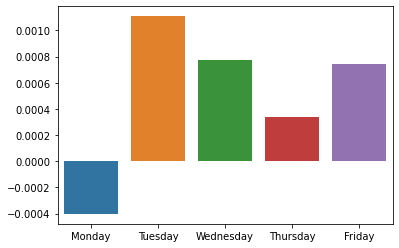

In [16]:
dd = nifty['Total Returns Index'].pct_change().groupby(nifty['day']).mean()
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
dd.index = pd.Categorical(dd.index, categories=days[:5], ordered=True)
sns.barplot(x=dd.index, y=dd.values)

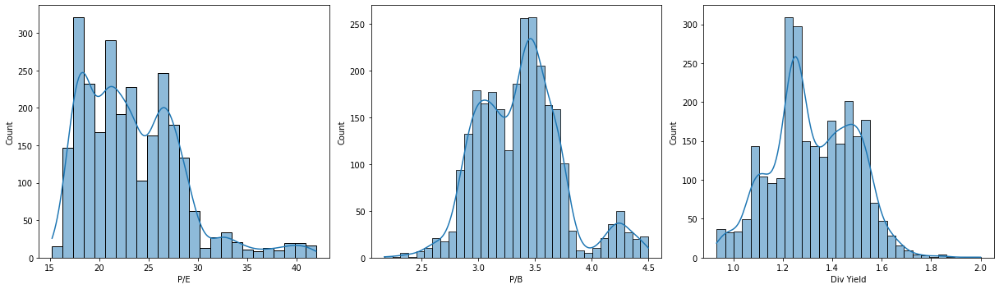

In [17]:
fig, axes = plt.subplots(1,3, figsize=(17,5))
for i, ax in enumerate(axes):
    sns.histplot(nifty[nifty.columns[i+1]], ax=ax, kde=True)
plt.tight_layout()

Percentage of days with positive returns

In [18]:
nifty[nifty['Total Returns Index'].pct_change() > 0].count()[0] / nifty['Total Returns Index'].count() * 100

53.8029224428625

Daily average returns

In [19]:
nifty['Total Returns Index'].pct_change().mean() * 100

0.05100041826822292

Median return

In [20]:
nifty['Total Returns Index'].pct_change().median() * 100

0.06613929591219314

<AxesSubplot:xlabel='Total Returns Index', ylabel='Count'>

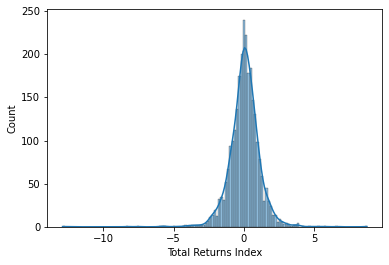

In [21]:
sns.histplot(nifty['Total Returns Index'].pct_change() * 100, kde=True)

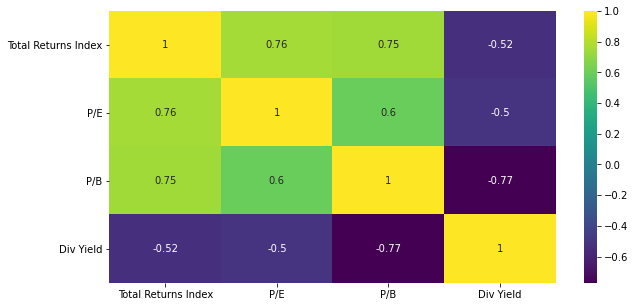

In [22]:
plt.figure(figsize=(10,5))
ax = sns.heatmap(data=nifty[1000:].corr(), annot=True, cmap='viridis')

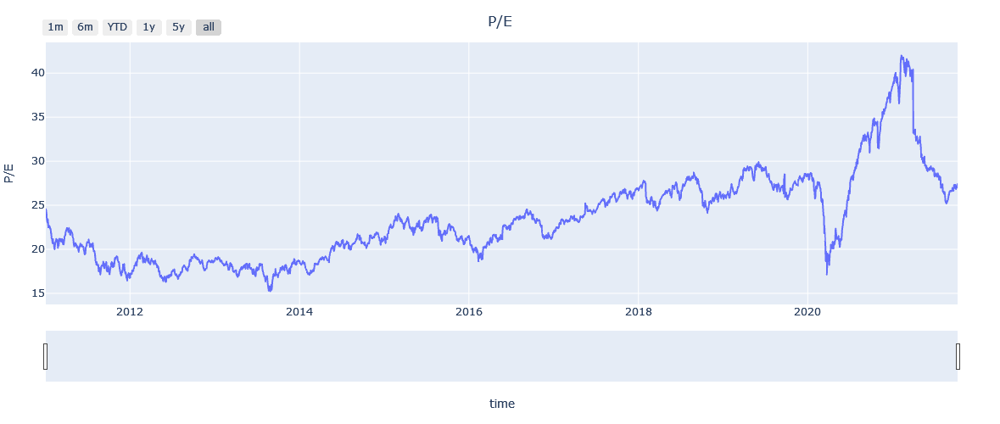

In [23]:
fig = px.line(nifty, x=nifty.index, y="P/E", title='P/E', height=500)
fig.update_layout(
    title={'text': "P/E", 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'},  xaxis_title='time', yaxis_title='P/E', margin=dict(l=50, r=50, b=50, t=50))
fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])))

fig.show()

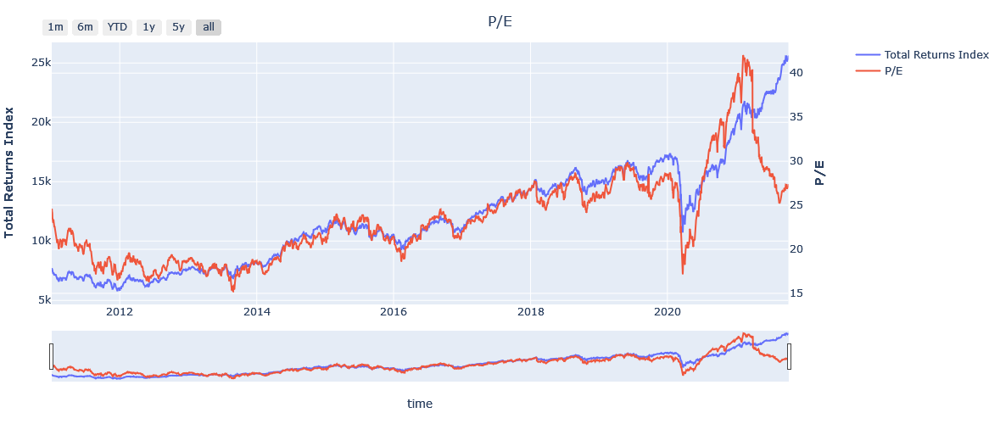

In [24]:
fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["Total Returns Index"], name='Total Returns Index'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/E"], name='P/E'), secondary_y=True)
fig.update_layout(
    title={'text': "P/E", 'x':0.5,'y':0.95, 'xanchor':'center','yanchor':'middle'},xaxis_title='time', margin=dict(l=50, r=50, b=50, t=50), height=500)
fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.update_yaxes(title_text="<b>Total Returns Index</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>P/E</b>", secondary_y=True)
fig.show()

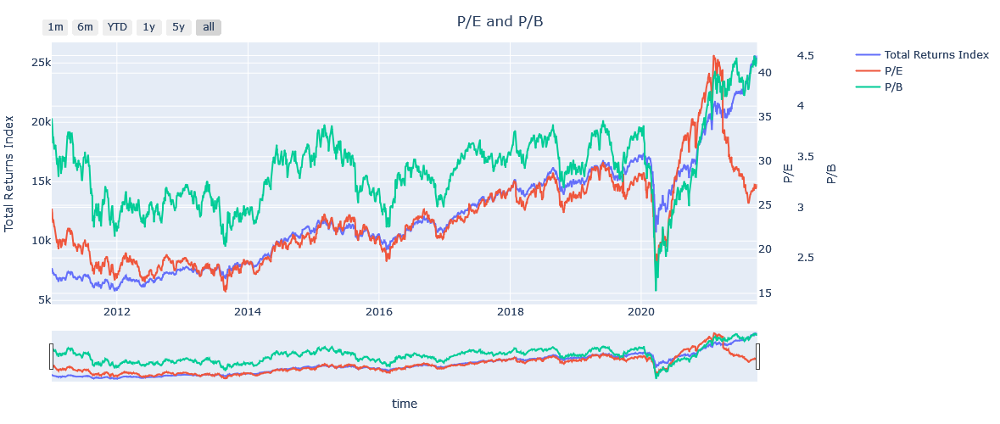

In [25]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=nifty.index, y=nifty["Total Returns Index"], name='Total Returns Index'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/E"], name='P/E', yaxis='y2'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/B"], name='P/B', yaxis='y3'))

fig.update_layout(xaxis=dict(domain=[0.0, 0.9]),
                  yaxis=dict(title="Total Returns Index"), yaxis2=dict(title = 'P/E', anchor="x", overlaying="y", side="right"),
                  yaxis3=dict(title = 'P/B', anchor="free", overlaying="y", side="right", position=.95),
    title={'text': "P/E and P/B", 'x':0.5,'y':0.95, 'xanchor':'center','yanchor':'middle'},xaxis_title='time', margin=dict(l=50, r=50, b=50, t=50), height=500)

fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([
                    dict(count=1, label="1m", step="month", stepmode="backward"),
                    dict(count=6, label="6m", step="month", stepmode="backward"),
                    dict(count=1, label="YTD", step="year", stepmode="todate"),
                    dict(count=1, label="1y", step="year", stepmode="backward"),
                    dict(count=5, label="5y", step="year", stepmode="backward"),
                    dict(step="all")])))

fig.show()

## relative comparison of multiple indexes

In [26]:
def compare_indices(indices, from_date=(2011,1,1)):
    fig = go.Figure()
    for i in indices:
        df = pd.read_excel(i + '.xlsx', index_col='Date')
        df = df.loc[dt.datetime(*from_date):]
        fig.add_trace(go.Scatter(x=df.index, y=df['Total Returns Index']/df['Total Returns Index'][0]*100, name=i+' Total Returns Index'))

    fig.update_layout(
        title={'text': "relative index", 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'},  xaxis_title='time', yaxis_title='Index', margin=dict(l=50, r=50, b=50, t=50))

    fig.update_layout(hovermode="x unified")

    fig.update_xaxes(rangeselector=dict(buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(step="all")
            ])))
    fig.show()

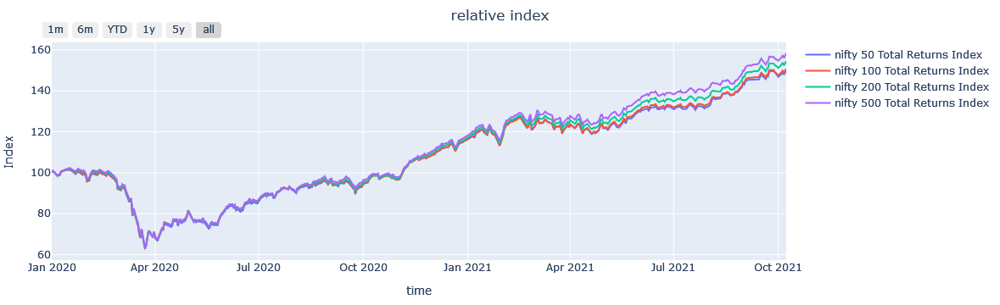

In [27]:
compare_indices(indexes[:4], from_date=(2020,1,1))

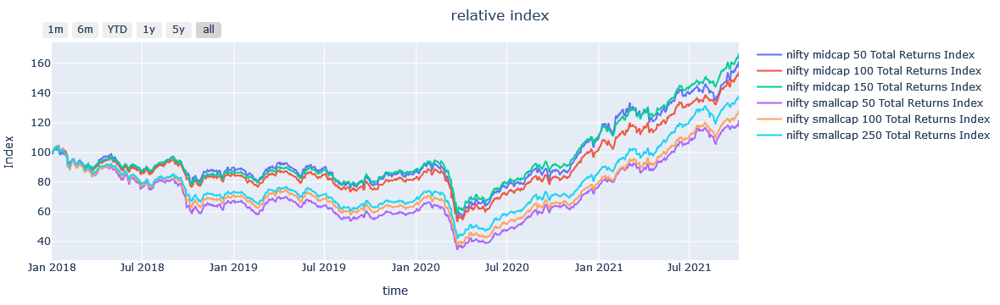

In [28]:
compare_indices(indexes[4:], from_date=(2018,1,1))

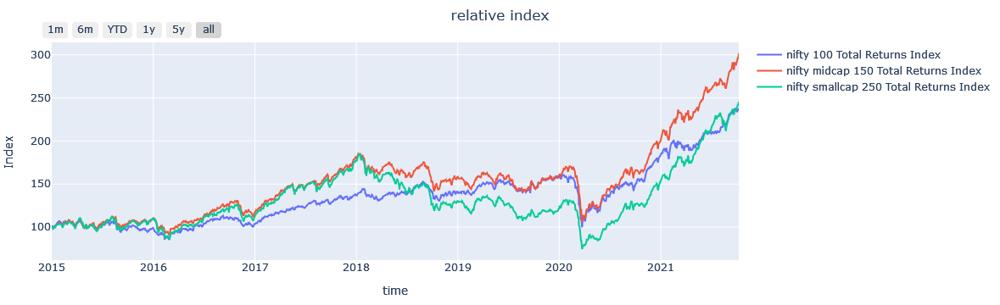

In [29]:
compare_indices([indexes[i] for i in [1,6,9]], from_date=(2015,1,1))

## two indices, two metrics

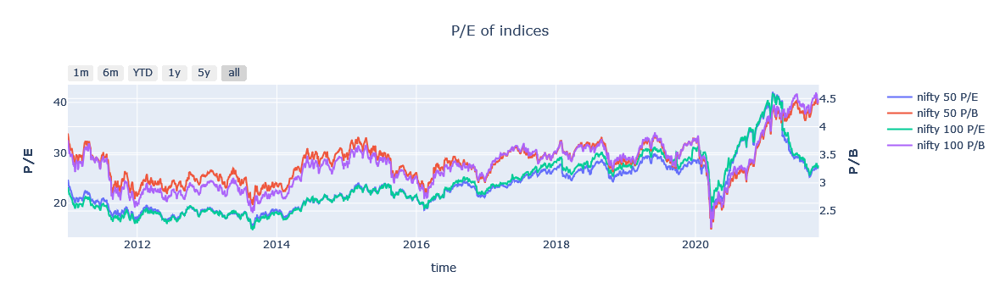

In [30]:
fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
for i in indexes[:2]:
    nifty = pd.read_excel(i + '.xlsx', index_col='Date')
    
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty['P/E'], name=i+' P/E'))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty['P/B'], name=i+' P/B'), secondary_y=True)
    
fig.update_layout(title={'text': "P/E of indices", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'middle'}, xaxis_title='time')

fig.update_layout(hovermode="x unified")

fig.update_xaxes(rangeslider_visible=False, rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.update_yaxes(title_text="<b>P/E</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>P/B</b>", secondary_y=True)
fig.update_yaxes(fixedrange=False)

fig.show()

In [31]:
def multiple_indices_two_metrics(indices, metric_1, metric_2):
    fig = go.Figure()
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    for i in indices:
        nifty = pd.read_excel(i + '.xlsx', index_col='Date')

        fig.add_trace(go.Scatter(x=nifty.index, y=nifty[metric_1], name=i + metric_1))
        fig.add_trace(go.Scatter(x=nifty.index, y=nifty[metric_2], name=i + metric_2), secondary_y=True)

    fig.update_layout(title={'text': metric_1 + ' ' + metric_2 + " of indices", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'middle'}, xaxis_title='time')

    fig.update_layout(hovermode="x unified")

    fig.update_xaxes(rangeslider_visible=False, rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(step="all")
            ])))
    fig.update_yaxes(title_text = metric_1, secondary_y=False)
    fig.update_yaxes(title_text = metric_2, secondary_y=True)
    fig.update_yaxes(fixedrange=False)

    fig.show()

In [32]:
[indexes[i] for i in [1,6,9]]

['nifty 100', 'nifty midcap 150', 'nifty smallcap 250']

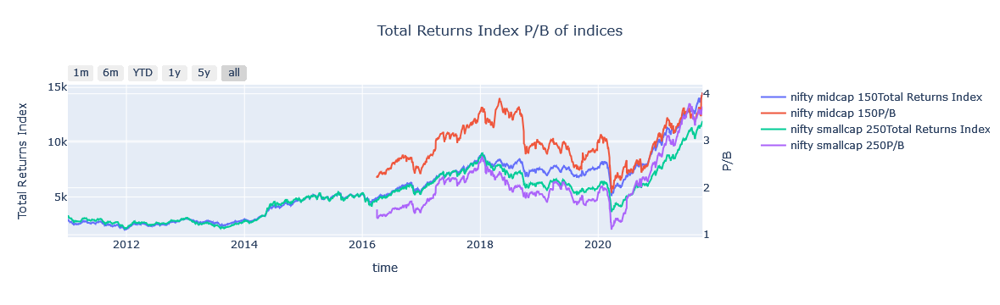

In [33]:
multiple_indices_two_metrics([indexes[i] for i in [6,9]], 'Total Returns Index', 'P/B')

## compare multiple indices with one metric

In [34]:
def compare_indices_metrics(indices, metric):
    fig = go.Figure()
    for i in indices:
        nifty = pd.read_excel(i + '.xlsx', index_col='Date')
        fig.add_trace(go.Scatter(x=nifty.index, y=nifty[metric], name=i[6:]+' '+metric))
    
    fig.update_layout(
        title={'text': metric + ' of indices', 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'}, 
        xaxis_title='time', yaxis_title=metric, margin=dict(l=50, r=50, b=50, t=50))
    
    fig.update_layout(hovermode="x unified")
    
    fig.update_xaxes(rangeslider_visible=False, rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(step="all")
            ])))
    fig.show()

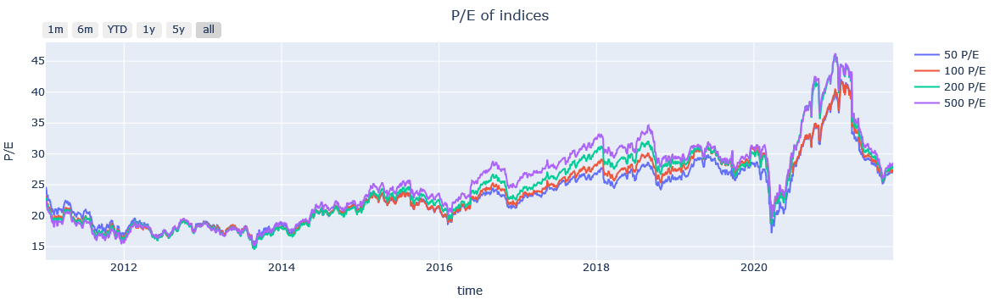

In [35]:
compare_indices_metrics(indexes[:4], 'P/E')

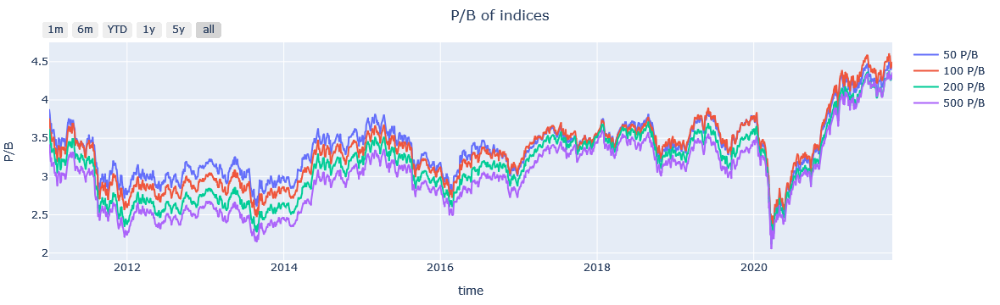

In [36]:
compare_indices_metrics(indexes[:4], 'P/B')

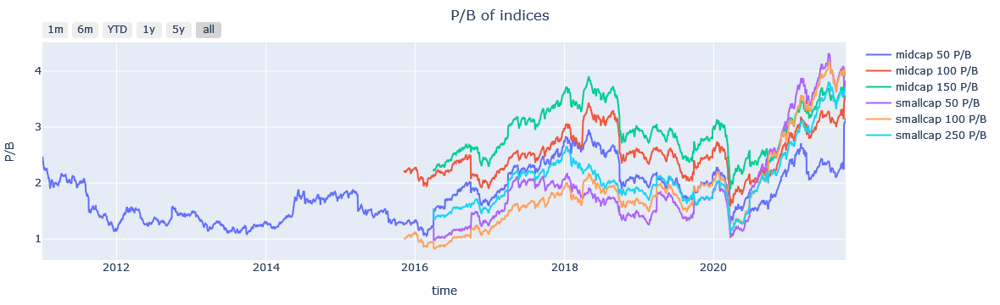

In [37]:
compare_indices_metrics(indexes[4:], 'P/B')

In [38]:
[indexes[i] for i in [1,6,9]]

['nifty 100', 'nifty midcap 150', 'nifty smallcap 250']

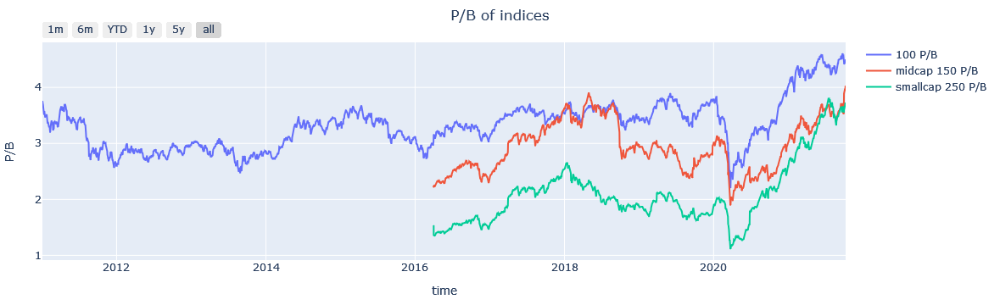

In [39]:
compare_indices_metrics([indexes[i] for i in [1,6,9]], 'P/B')

# yealy returns

In [40]:
cagr_list = []

In [41]:
for i in indexes:
    df_index = pd.read_excel(i+'.xlsx', index_col='Date')
    for j in range(2011,2022):
        cagr_list.append(cagr_calc(df_index, (j,1,1), (j,12,31))[0])

In [42]:
np.reshape(cagr_list, (10, 11))

array([[-2.433e+01,  2.918e+01,  7.260e+00,  3.305e+01, -3.040e+00,
         4.190e+00,  3.075e+01,  5.610e+00,  1.302e+01,  1.601e+01,
         3.922e+01],
       [-2.544e+01,  3.236e+01,  7.000e+00,  3.494e+01, -1.320e+00,
         4.670e+00,  3.319e+01,  3.400e+00,  1.148e+01,  1.597e+01,
         4.004e+01],
       [-2.664e+01,  3.349e+01,  4.980e+00,  3.732e+01, -8.700e-01,
         4.670e+00,  3.543e+01,  1.040e+00,  9.710e+00,  1.670e+01,
         4.346e+01],
       [-2.704e+01,  3.341e+01,  3.900e+00,  3.924e+01,  4.000e-02,
         4.690e+00,  3.775e+01, -1.560e+00,  8.670e+00,  1.770e+01,
         4.630e+01],
       [-4.022e+01,  3.676e+01, -2.980e+00,  4.645e+01,  2.900e+00,
         6.590e+00,  5.199e+01, -1.010e+01, -3.610e+00,  2.599e+01,
         6.293e+01],
       [-3.080e+01,  4.195e+01, -4.820e+00,  5.724e+01,  7.330e+00,
         7.180e+00,  4.857e+01, -1.454e+01, -3.500e+00,  2.273e+01,
         7.001e+01],
       [-3.191e+01,  4.734e+01, -2.450e+00,  6.200e+01,  9

In [43]:
returns_by_year = pd.DataFrame(np.reshape(cagr_list, (10, 11)), columns=list(range(2011,2022)), index=indexes)
returns_by_year

,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
nifty 50,-24.33,29.18,7.26,33.05,-3.04,4.19,30.75,5.61,13.02,16.01,39.22
nifty 100,-25.44,32.36,7.00,34.94,-1.32,4.67,33.19,3.40,11.48,15.97,40.04
nifty 200,-26.64,33.49,4.98,37.32,-0.87,4.67,35.43,1.04,9.71,16.70,43.46
nifty 500,-27.04,33.41,3.90,39.24,0.04,4.69,37.75,-1.56,8.67,17.70,46.30
nifty midcap 50,-40.22,36.76,-2.98,46.45,2.90,6.59,51.99,-10.10,-3.61,25.99,62.93
nifty midcap 100,-30.80,41.95,-4.82,57.24,7.33,7.18,48.57,-14.54,-3.50,22.73,70.01
nifty midcap 150,-31.91,47.34,-2.45,62.00,9.30,5.48,55.11,-12.52,0.58,25.12,68.32
nifty smallcap 50,-40.48,35.07,-10.59,63.10,3.13,-1.03,54.11,-32.60,-10.53,26.12,79.05
nifty smallcap 100,-33.94,38.64,-8.28,54.39,7.05,2.11,56.70,-29.09,-8.95,21.90,82.91
nifty smallcap 250,-36.09,40.22,-7.66,69.64,9.99,0.52,56.87,-26.60,-7.61,25.55,82.64


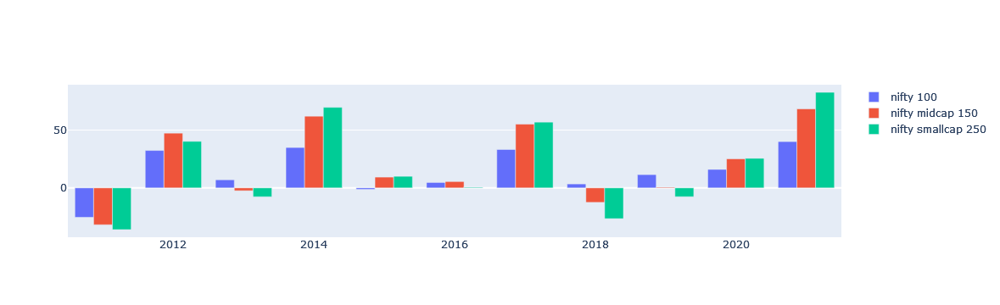

In [44]:
years=list(range(2011,2022))

fig = go.Figure(data=[
    go.Bar(name='nifty 100', x=years, y=returns_by_year.loc['nifty 100'].to_list()),
    go.Bar(name='nifty midcap 150', x=years, y=returns_by_year.loc['nifty midcap 150'].to_list()),
    go.Bar(name='nifty smallcap 250', x=years, y=returns_by_year.loc['nifty smallcap 250'].to_list())
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

In [45]:
returns_by_year = pd.melt(returns_by_year.reset_index(), id_vars=['index'], var_name='year', value_name='return')

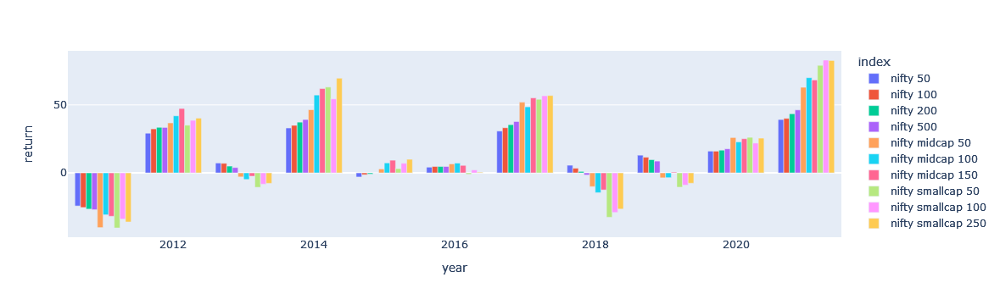

In [46]:
fig = px.bar(returns_by_year, x='year', y='return', color='index')
fig.update_layout(barmode='group')
fig.show()

<AxesSubplot:xlabel='year', ylabel='return'>

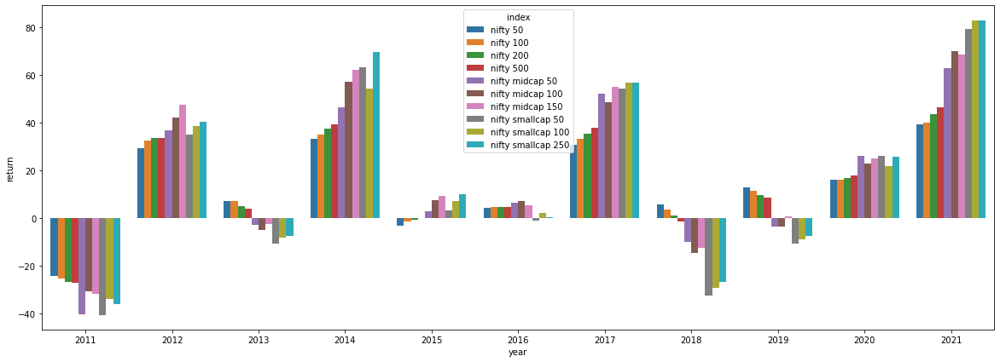

In [47]:
plt.figure(figsize=(20,7))
sns.barplot(data=returns_by_year, x='year', y='return', hue='index')

In [48]:
np.unique(nifty.index.year, return_counts=True)

(array([2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021],
       dtype=int64),
 array([247, 251, 250, 244, 248, 247, 248, 246, 245, 252, 191], dtype=int64))

In [49]:
for i in range(10):
    print(nifty.index[i*249])

2011-01-03 00:00:00
2012-01-04 00:00:00
2013-01-01 00:00:00
2013-12-31 00:00:00
2015-01-07 00:00:00
2016-01-08 00:00:00
2017-01-11 00:00:00
2018-01-11 00:00:00
2019-01-16 00:00:00
2020-01-22 00:00:00


In [50]:
nifty_yearly = pd.DataFrame()

In [51]:
nifty_yearly['last 1 year returns'] = nifty['Total Returns Index'].pct_change(periods=249)

In [52]:
nifty_yearly['last 2 year returns'] = nifty['Total Returns Index'].pct_change(periods=249*2)

In [53]:
nifty_yearly['last 3 year returns'] = nifty['Total Returns Index'].pct_change(periods=249*3)

In [54]:
nifty_yearly['last 4 year returns'] = nifty['Total Returns Index'].pct_change(periods=249*4)

In [55]:
nifty_yearly['last 5 year returns'] = nifty['Total Returns Index'].pct_change(periods=249*5)

In [56]:
nifty_yearly['next 1 year returns'] = nifty_yearly['last 1 year returns'].shift(periods=-249)

In [57]:
nifty_yearly['next 2 year returns'] = nifty_yearly['last 2 year returns'].shift(periods=-249*2)

In [58]:
nifty_yearly['next 3 year returns'] = nifty_yearly['last 3 year returns'].shift(periods=-249*3)

In [59]:
nifty_yearly['next 4 year returns'] = nifty_yearly['last 4 year returns'].shift(periods=-249*4)

In [60]:
nifty_yearly['next 5 year returns'] = nifty_yearly['last 5 year returns'].shift(periods=-249*5)

In [61]:
nifty_yearly = nifty_yearly*100

In [62]:
nifty_with_returns = pd.concat([nifty, nifty_yearly], axis=1)

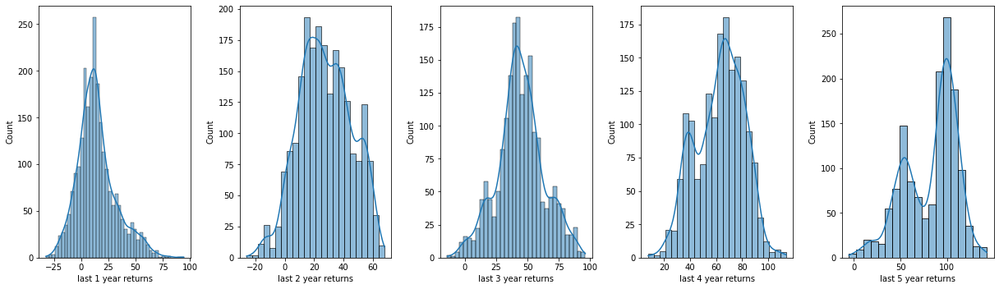

In [63]:
fig, axes = plt.subplots(1,5, figsize=(17,5))
for i, ax in enumerate(axes):
    sns.histplot(nifty_yearly.iloc[:,i], ax=ax, kde=True)
plt.tight_layout()

yearly correlations between returns and metric

In [64]:
for i in range(0, nifty['P/B'].count(), 249):
    print(f"On {nifty.index[i].date()} next 1 year returns are {round(nifty_yearly['next 1 year returns'].iloc[i], 2)} and correlation between P/B and returns is {round(nifty['P/B'].iloc[i:i+249].corr(nifty_yearly['next 1 year returns'].iloc[i:i+249]),2)}")

On 2011-01-03 next 1 year returns are -23.13 and correlation between P/B and returns is -0.94
On 2012-01-04 next 1 year returns are 30.03 and correlation between P/B and returns is -0.66
On 2013-01-01 next 1 year returns are 6.98 and correlation between P/B and returns is -0.82
On 2013-12-31 next 1 year returns are 31.98 and correlation between P/B and returns is -0.94
On 2015-01-07 next 1 year returns are -3.06 and correlation between P/B and returns is -0.86
On 2016-01-08 next 1 year returns are 12.45 and correlation between P/B and returns is -0.46
On 2017-01-11 next 1 year returns are 30.9 and correlation between P/B and returns is -0.36
On 2018-01-11 next 1 year returns are 1.22 and correlation between P/B and returns is -0.74
On 2019-01-16 next 1 year returns are 11.48 and correlation between P/B and returns is -0.41
On 2020-01-22 next 1 year returns are 20.91 and correlation between P/B and returns is -0.83
On 2021-01-19 next 1 year returns are nan and correlation between P/B an

In [65]:
nifty['P/E'].iloc[:1000].corr(nifty_yearly['next 1 year returns'].iloc[:1000])

-0.684931310494683

In [66]:
nifty['P/E'].iloc[1000:].corr(nifty_yearly['next 1 year returns'].iloc[1000:])

-0.12903805883262795

In [67]:
nifty['Div Yield'].corr(nifty_yearly['next 1 year returns'])

0.6254912972652347

In [68]:
def compare_three(y1, y2, y3):
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y1], name=y1))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y2], name=y2, yaxis='y2'))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y3], name=y3, yaxis='y3'))

    fig.update_layout(xaxis=dict(domain=[0.0, 0.9]),
                      yaxis=dict(title=y1), 
                      yaxis2=dict(title = y2, anchor="x", overlaying="y", side="right"),
                      yaxis3=dict(title = y3, anchor="free", overlaying="y", side="right", position=.95),
        title={'text': y1+' '+y2+' '+y3, 'x':0.5,'y':0.95, 'xanchor':'center','yanchor':'middle'},xaxis_title='time', margin=dict(l=50, r=50, b=50, t=50), height=500)

    fig.update_layout(hovermode="x unified")

    fig.update_xaxes(rangeslider_visible=True, 
                     rangeselector=dict(buttons=list([
                        dict(count=1, label="1m", step="month", stepmode="backward"),
                        dict(count=6, label="6m", step="month", stepmode="backward"),
                        dict(count=1, label="YTD", step="year", stepmode="todate"),
                        dict(count=1, label="1y", step="year", stepmode="backward"),
                        dict(count=5, label="5y", step="year", stepmode="backward"),
                        dict(step="all")])))
    fig.show()

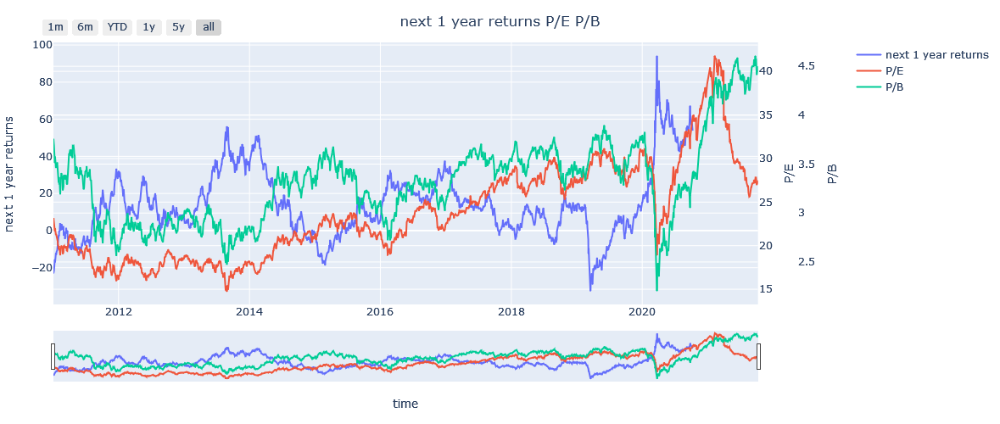

In [69]:
compare_three('next 1 year returns', 'P/E', 'P/B')

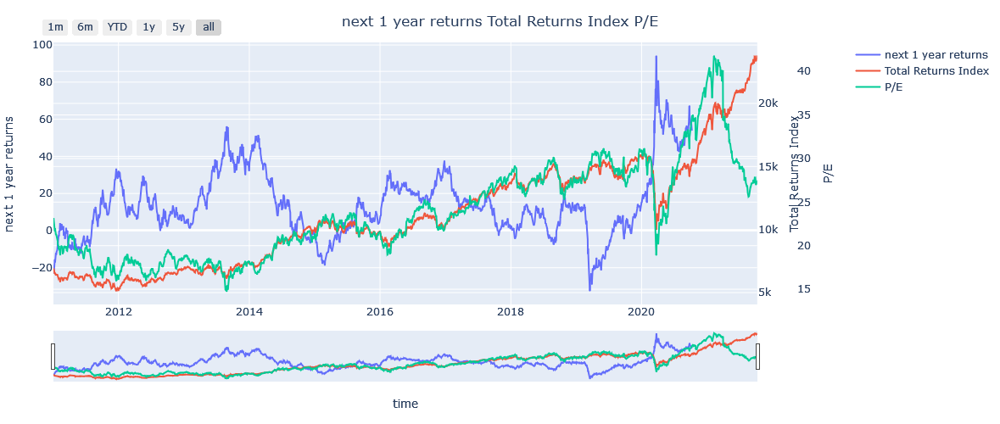

In [70]:
compare_three('next 1 year returns', 'Total Returns Index', 'P/E')

<AxesSubplot:>

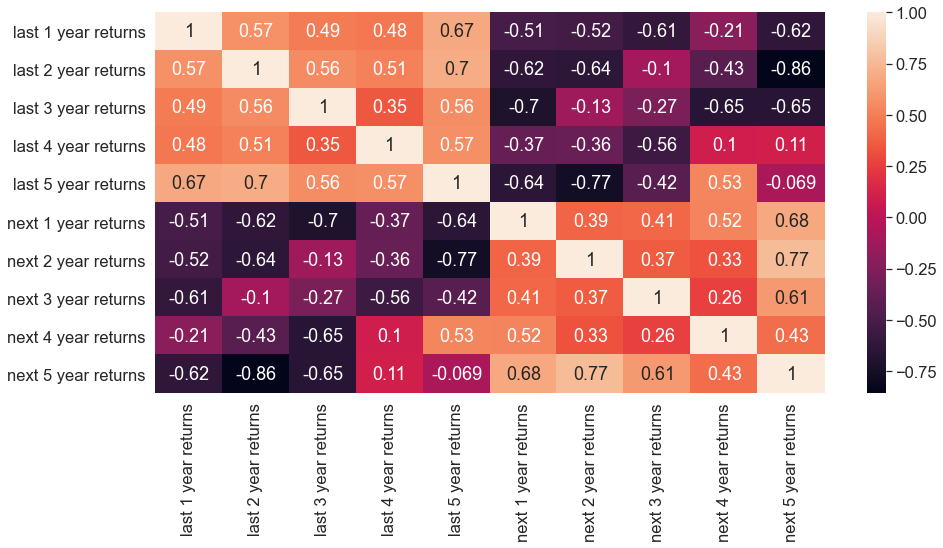

In [71]:
plt.figure(figsize = (15,7))
sns.set(font_scale=1.5)
sns.heatmap(nifty_yearly.corr(), annot=True)

In [72]:
nifty_with_returns.iloc[1000:, :]

,Total Returns Index,P/E,P/B,Div Yield,last 1 year returns,last 2 year returns,last 3 year returns,last 4 year returns,last 5 year returns,next 1 year returns,next 2 year returns,next 3 year returns,next 4 year returns,next 5 year returns
Date,,,,,,,,,,,,,,
2015-01-13,10005.12,21.13,3.35,1.23,37.404467,43.523242,87.991252,50.909974,NaN,-6.443601,6.847394,40.636194,41.255677,56.948143
2015-01-14,9982.57,21.07,3.35,1.24,37.862140,42.944266,83.354823,54.339010,NaN,-7.665862,7.400499,40.990146,40.434778,58.253536
2015-01-15,10223.17,21.58,3.43,1.21,40.884874,47.058096,87.081987,58.282563,NaN,-11.106438,5.121406,38.667752,37.348885,53.124716
2015-01-16,10254.25,21.64,3.44,1.20,41.619008,47.605181,88.359090,55.880886,NaN,-10.340786,3.657508,39.178975,35.931833,51.675452
2015-01-19,10297.97,21.69,3.45,1.20,42.221832,48.891408,87.793051,59.190011,NaN,-12.258824,3.811528,39.992736,33.731405,47.058012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-04,23556.98,27.21,4.45,1.16,57.282772,60.286239,64.715005,84.248921,110.874121,NaN,NaN,NaN,NaN,NaN
2021-10-05,23722.31,27.40,4.48,1.16,57.300673,63.429917,67.247204,85.490968,114.686396,NaN,NaN,NaN,NaN,NaN
2021-10-06,23490.16,27.13,4.44,1.17,53.840653,62.757420,66.507603,86.382506,112.963389,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:>

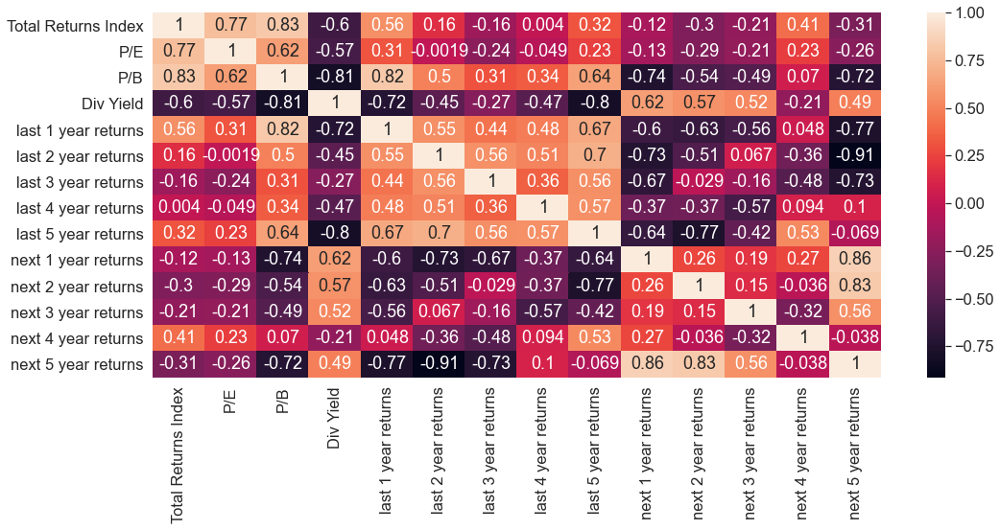

In [73]:
plt.figure(figsize = (17,7))
sns.set(font_scale=1.5)
sns.heatmap(nifty_with_returns.iloc[1000:, :].corr(), annot=True)

# Linear Regression

In [74]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [75]:
data_set = nifty_with_returns[['P/E', 'P/B', 'Div Yield','next 1 year returns']]

In [76]:
X = data_set[1000:].dropna()[['P/E', 'P/B', 'Div Yield']]
Y = data_set[1000:].dropna()['next 1 year returns']

In [77]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=101)

In [78]:
model = LinearRegression()

In [79]:
model.fit(X_train, Y_train)

LinearRegression()

In [80]:
model.coef_

array([  2.71701381, -70.00472571,   0.70819938])

In [81]:
model.score(X_test, Y_test)

0.7132932262101603

In [82]:
pred = model.predict(X_test)

<AxesSubplot:ylabel='next 1 year returns'>

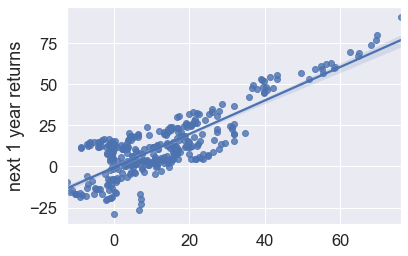

In [83]:
sns.regplot(x=pred, y=Y_test)

In [84]:
nifty.tail(1)

,Total Returns Index,P/E,P/B,Div Yield
Date,,,,
2021-10-08,23799.61,27.49,4.5,1.15


In [85]:
nifty.tail(1).values[0][1:4]

array([27.49,  4.5 ,  1.15])

In [86]:
arr = nifty.tail(1).values[0][1:4]

In [87]:
model.predict(arr.reshape(1,-1))

array([-59.67784951])